In [1]:
# sentinel 2 imgae clustering classification

import rasterio as rio
from rasterio.plot import show
from sklearn import cluster
import matplotlib.pyplot as plt
import matplotlib.colors as mc
import numpy as np
import os

In [4]:
## Open the image 
#root_directory = '/home/jovyan/u_net/masks'
root_directory = '/home/jovyan/data'
image_list = []

for path, subdirs, files in os.walk(root_directory):
    print(path)  
    dirname = path.split(os.path.sep)[-1]
    #if dirname == 'R10m':   #Find all 'images' directories
    #if dirname == 'masks':   #Find all 'images' directories
    if dirname == 'data':   #Find all 'images' directories
        images = os.listdir(path)  #List of all image names in this subdirectory
        for i, image_name in enumerate(images):  
            if image_name.endswith(".tif"):   #Only read jpg images...
               #print(image_name)
               image_list.append(image_name)
               #image_name = rio.open(root_directory+'/'+image_name)
image_list

#raster = rio.open("/home/jovyan/output/ndvi_20240108.tif")
#raster = rio.open("/home/jovyan/results/unet_input/4bands_for_unet.tiff")
#raster = rio.open("/home/jovyan/results/ndviOct23.tif")

#print(raster.meta)
#print(raster.meta)
#print(raster.shape)


/home/jovyan/data
/home/jovyan/data/.ipynb_checkpoints


['eichenberg_orthophoto.tif']

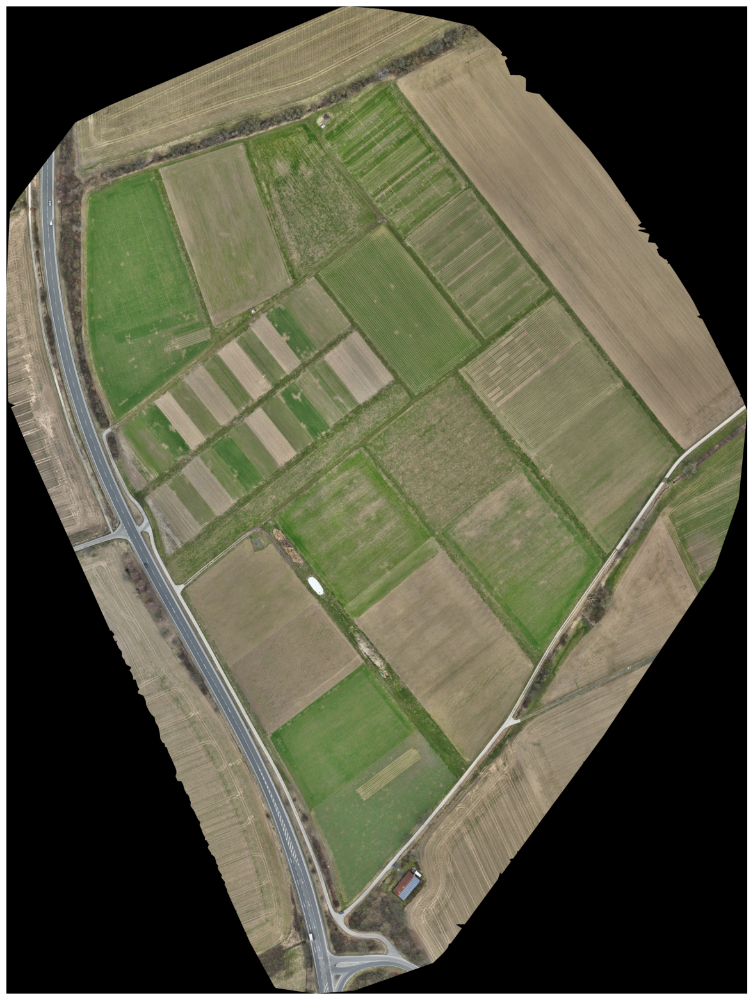

In [5]:
# Read, enhance and show the image
for image in image_list:
    raster = rio.open(root_directory+'/'+image)
    arr = raster.read()
    vmin, vmax = np.nanpercentile(arr, (5,95))  # 5-95% contrast stretch
    
    fig, ax = plt.subplots(figsize=[20,20], ncols=1,nrows=1)
    #show(raster, cmap='gray', vmin=vmin, vmax=vmax, ax=ax)
    show(raster, cmap='gray', ax=ax)
    ax.set_axis_off()
    #fig.savefig("kargi.jpg", bbox_inches='tight')
    plt.show()

In [6]:

# print the shape of the original image
arr.shape
# create an empty array with same dimension and data type
imgxyb = np.empty((raster.count, raster.height, raster.width), raster.meta['dtype'])
imgxyb.shape
#for band in range(imgxyb.shape[0]):
#    imgxyb[band,:,:] = raster.read(band+1)
#img1d = imgxyb[:10,:,:].reshape((imgxyb.shape[1]*imgxyb.shape[2],imgxyb.shape[0]))
#img1d

(4, 16991, 12757)

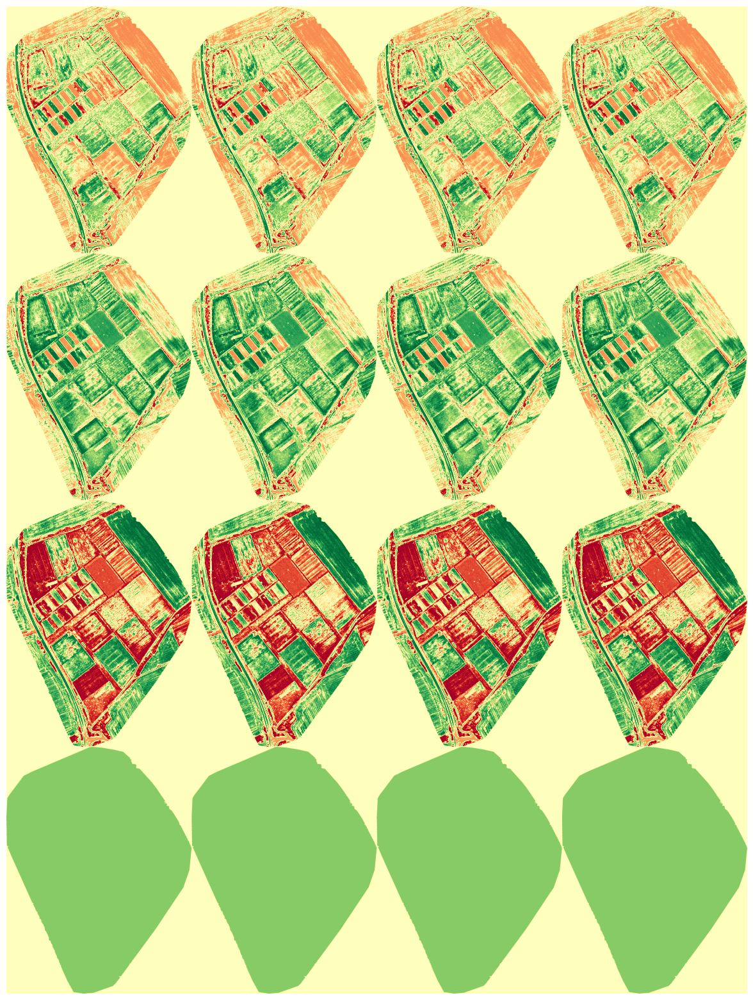

In [7]:
import rasterio
from rasterio.transform import Affine
from rasterio.enums import Resampling

for image in image_list:
    raster = rio.open(root_directory+'/'+image)
    arr = raster.read()
    imgxyb = np.empty((raster.count, raster.height, raster.width), raster.meta['dtype'])
    for band in range(imgxyb.shape[0]):
        imgxyb[band,:,:] = raster.read(band+1)
    img1d = imgxyb[:10,:,:].reshape((imgxyb.shape[1]*imgxyb.shape[2],imgxyb.shape[0]))
    cl = cluster.KMeans(n_clusters=5, n_init=5)
    param = cl.fit(img1d)
    cl.labels_
     
    
    # get the labels of the classes and reshape it x-y-bands shape order (one band only)
    img_cl = cl.labels_
    img_cl = img_cl.reshape(imgxyb[0,:,:].shape)
    img_cl.shape
    cmap="RdYlGn_r"
    # Show the resulting array and save it as jpg image
    plt.figure(figsize=[20,20])
    plt.imshow(img_cl, cmap=cmap)
    
    plt.axis('off')
    #plt.savefig("/home/jovyan/results/mask/ndvi_kmeans_mask.png", bbox_inches='tight', pad_inches=0)
    plt.show()

    # Define the output file path
    output_file = root_directory+'/'+"classified_"+image
    
    # Update the metadata for the output file
    transform = raster.transform
    height, width = img_cl.shape
    count = 1  # assuming a single band
    dtype = rasterio.uint8  # update with the appropriate data type
    
    # Write the result to the output file
    with rasterio.open(output_file, 'w', driver='GTiff', height=height, width=width, count=count, dtype=dtype, crs=raster.crs, transform=transform) as dst:
        dst.write(img_cl, 1)

In [8]:
arr.shape
imgxyb.shape

(4, 16991, 12757)

In [9]:
# loop through the raster's bands to fill the empty array
for band in range(imgxyb.shape[0]):
    imgxyb[band,:,:] = raster.read(band+1)
print(imgxyb.shape)

(4, 16991, 12757)


In [18]:
# check number of bands here
# convet to 1d array
img1d = imgxyb[:4,:,:].reshape((imgxyb.shape[1]*imgxyb.shape[2],imgxyb.shape[0]))
#img1d = imgxyb.reshape((imgxyb.shape[0], -1)).T


In [19]:
img1d.shape

(216754187, 4)

In [20]:
# create an object of the classifier and train it
cl = cluster.KMeans(n_clusters=5, n_init=5)
param = cl.fit(img1d)
cl.labels_

# get the labels of the classes and reshape it x-y-bands shape order (one band only)
img_cl = cl.labels_
img_cl = img_cl.reshape(imgxyb[0,:,:].shape)
img_cl.shape


(16991, 12757)

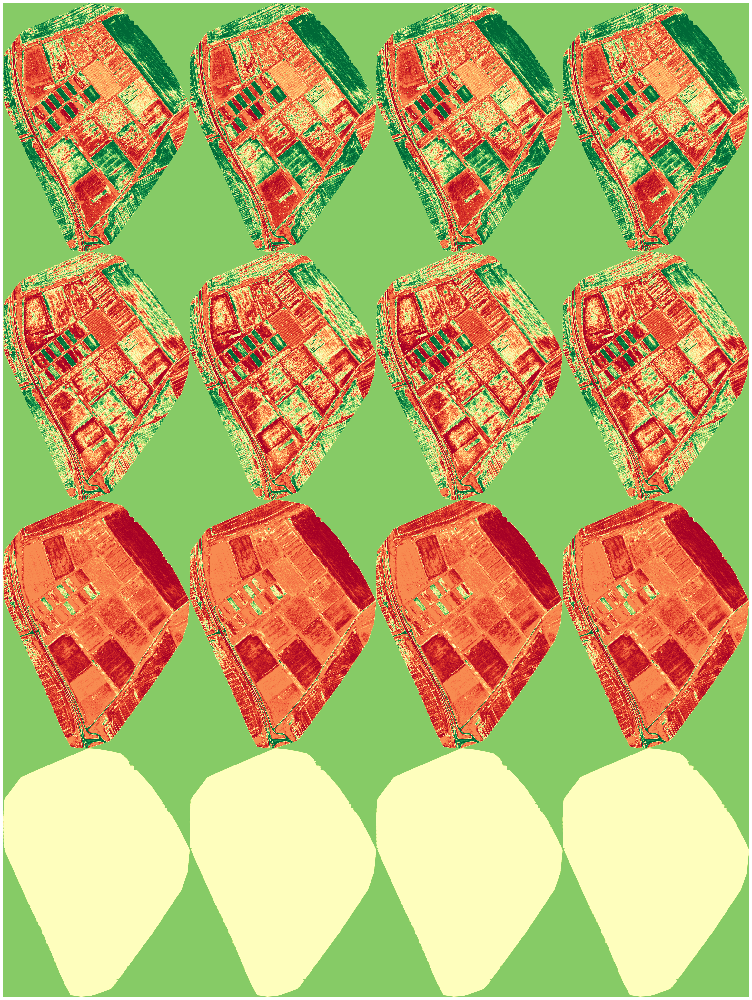

In [21]:
# Create a custom color map to represent our different 5 classes
#cmap = mc.LinearSegmentedColormap.from_list("", ["blue","" ,"brown","red","orange","yellow","green"])
cmap="RdYlGn_r"
# Show the resulting array and save it as jpg image
plt.figure(figsize=[40,40])
plt.imshow(img_cl, cmap=cmap)

plt.axis('off')
#plt.savefig("/home/jovyan/results/mask/ndvi_kmeans_mask.png", bbox_inches='tight', pad_inches=0)
plt.show()

In [14]:
import rasterio
from rasterio.transform import Affine
from rasterio.enums import Resampling

# Define the output file path
#output_file = "/home/jovyan/u_net/masks/classified_eichenberg_ndvi.tif"
output_file = "/home/jovyan/data/classified_eichenberg.tif"

# Update the metadata for the output file
transform = raster.transform
height, width = img_cl.shape
count = 1  # assuming a single band
dtype = rasterio.uint8  # update with the appropriate data type

# Write the result to the output file
with rasterio.open(output_file, 'w', driver='GTiff', height=height, width=width, count=count, dtype=dtype, crs=raster.crs, transform=transform) as dst:
    dst.write(img_cl, 1)